In [162]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from mpl_toolkits.axes_grid1 import ImageGrid
import numpy as np
import cv2
import os
import plotly.graph_objects as go
import random
import statistics
import pandas as pd
import plotly.express as px
from glob import glob
import skimage
import math
from tensorflow.keras.preprocessing import image
from skimage.io import imread, imshow
from skimage.color import rgb2gray
from skimage.measure import label, regionprops, regionprops_table
from skimage.filters import threshold_otsu
from skimage.morphology import area_closing, area_opening
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from detecta import detect_peaks
from PIL import Image as im

In [124]:
def categorise(row):  
    if row['MEL']==1.0:
        return 'MEL'
    elif row['NV']==1.0:
        return 'NV'
    elif row['DF']==1.0:
        return 'DF'
    elif row['VASC']==1.0:
        return 'VASC'
    else: 
        return 'UNK'

In [281]:
imagePath = 'E://Praca_inzynierska//archive//ISIC_2019_Training_Input//ISIC_2019_Training_Input//'
dataPath=  'E://Praca_inzynierska//archive//'

df = pd.read_csv(f'{dataPath}ISIC_2019_Training_GroundTruth.csv')

df2 = pd.read_csv(f'{dataPath}ISIC_2019_Training_Metadata.csv')

df = pd.merge(df,df2)



df = df.loc[(df['AK']==0.0) & (df['SCC']==0.0) & (df['BKL']==0.0) & (df['BCC']==0.0)]

df['Type'] = df.apply(lambda row: categorise(row), axis=1)
df.drop(['AK','SCC','BKL','BCC','lesion_id','MEL','NV','DF','VASC','UNK'],axis=1,inplace=True)



df.head()



,image,age_approx,anatom_site_general,sex,Type
0,ISIC_0000000,55.0,anterior torso,female,NV
1,ISIC_0000001,30.0,anterior torso,female,NV
2,ISIC_0000002,60.0,upper extremity,female,MEL
3,ISIC_0000003,30.0,upper extremity,male,NV
4,ISIC_0000004,80.0,posterior torso,male,MEL


In [9]:
#usunać lub zmienic na dodawanie

for index, row in df.iterrows():
    if(not os.path.exists(imagePath+row['image'] + ".jpg")):
        df.drop(df.index[index], inplace=True)
        print("usunieto"+row['image'])

print('Total number of images: %s' % len(df.index))

Total number of images: 17889


   Type   Mean_age  Percent_male  Percent_female
0    NV  44.888517      0.483495        0.495456
1   MEL  60.720081      0.544228        0.437859
2    DF  51.694561      0.510460        0.489540
3  VASC  53.241107      0.505929        0.494071


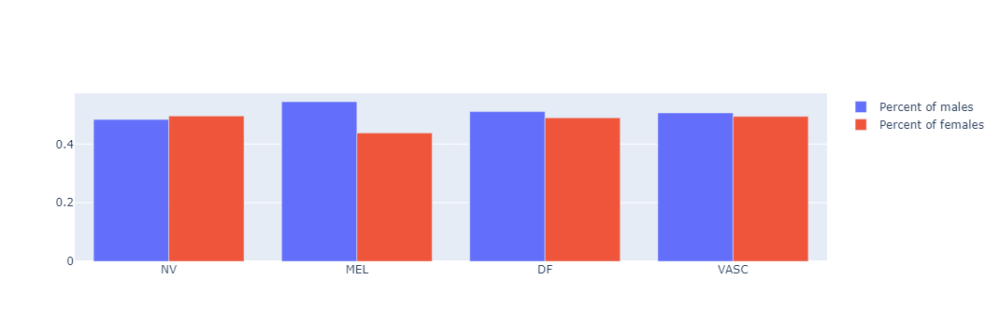

In [127]:
dfNV=df[df['Type']=='NV']
dfMEL=df[df['Type']=='MEL']
dfDF=df[df['Type']=='DF']
dfVASC=df[df['Type']=='VASC']

data={'Type':['NV','MEL','DF','VASC'],
      'Mean_age':[np.nanmean(dfNV['age_approx']),np.nanmean(dfMEL['age_approx']),np.nanmean(dfDF['age_approx']),
                 np.nanmean(dfVASC['age_approx'])],
      'Percent_male':[(len(dfNV[dfNV['sex']=='male'].index)/len(dfNV.index)),
                     (len(dfMEL[dfMEL['sex']=='male'].index)/len(dfMEL.index)),
                     (len(dfDF[dfDF['sex']=='male'].index)/len(dfDF.index)),
                     (len(dfVASC[dfVASC['sex']=='male'].index)/len(dfVASC.index))],
      'Percent_female':[(len(dfNV[dfNV['sex']=='female'].index)/len(dfNV.index)),
                     (len(dfMEL[dfMEL['sex']=='female'].index)/len(dfMEL.index)),
                     (len(dfDF[dfDF['sex']=='female'].index)/len(dfDF.index)),
                     (len(dfVASC[dfVASC['sex']=='female'].index)/len(dfVASC.index))]
     }

dfData = pd.DataFrame(data)
print(dfData)

fig = go.Figure(data=[
    go.Bar(name='Percent of males', x=dfData['Type'], y=dfData['Percent_male']),
    go.Bar(name='Percent of females', x=dfData['Type'], y=dfData['Percent_female'])
])
# Change the bar mode
fig.update_layout(barmode='group')
fig.show()

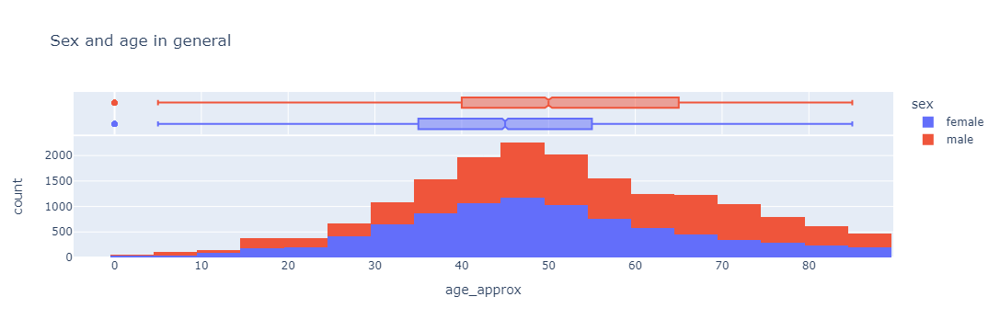

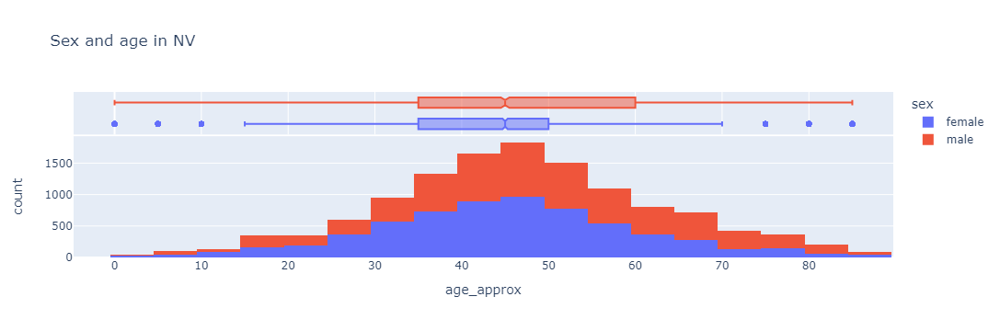

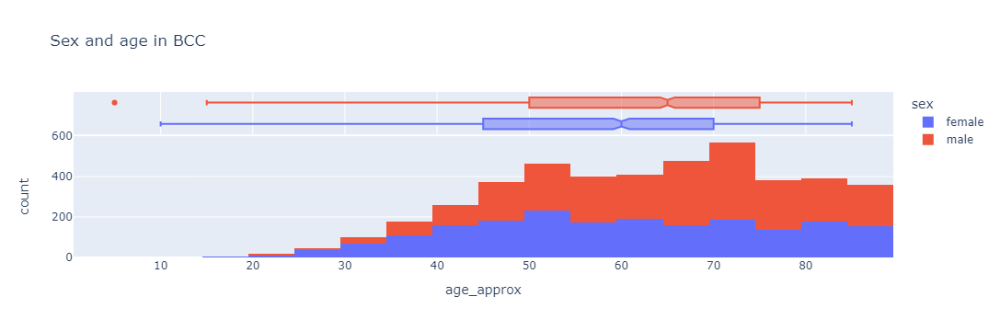

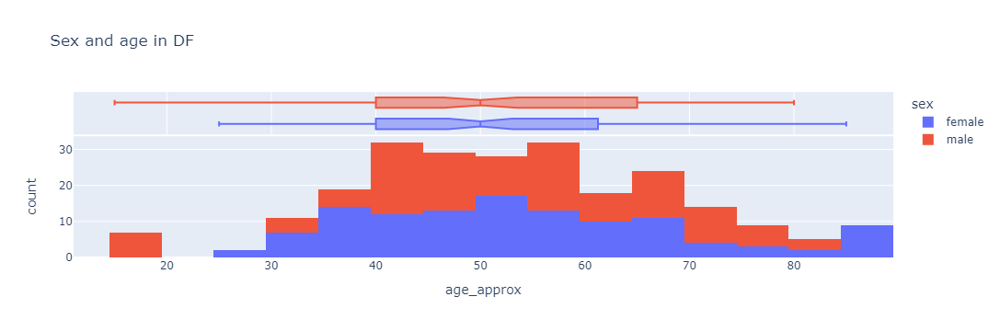

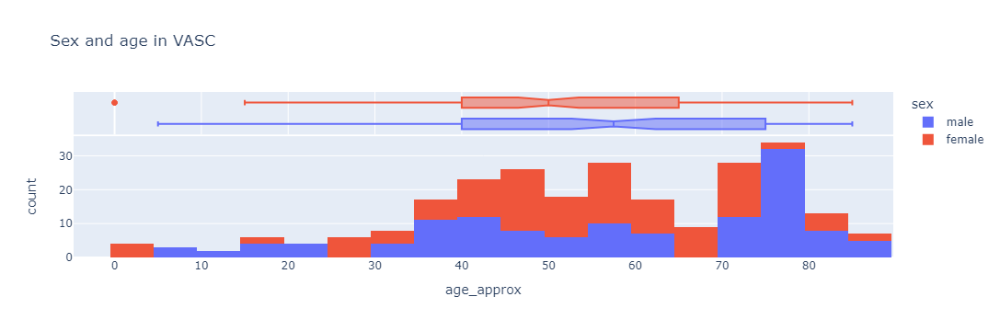

In [5]:


# Here we use a column with categorical data
fig = px.histogram(df, x="age_approx",color='sex',title='Sex and age in general',marginal="box")
fig.show()


fig = px.histogram(dfNV, x="age_approx",color='sex',title='Sex and age in NV',marginal="box")
fig.show()

fig = px.histogram(dfMEL, x="age_approx",color='sex',title='Sex and age in BCC',marginal="box")
fig.show()

fig = px.histogram(dfDF, x="age_approx",color='sex',title='Sex and age in DF',marginal="box")
fig.show()

fig = px.histogram(dfVASC, x="age_approx",color='sex',title='Sex and age in VASC',marginal="box")
fig.show()

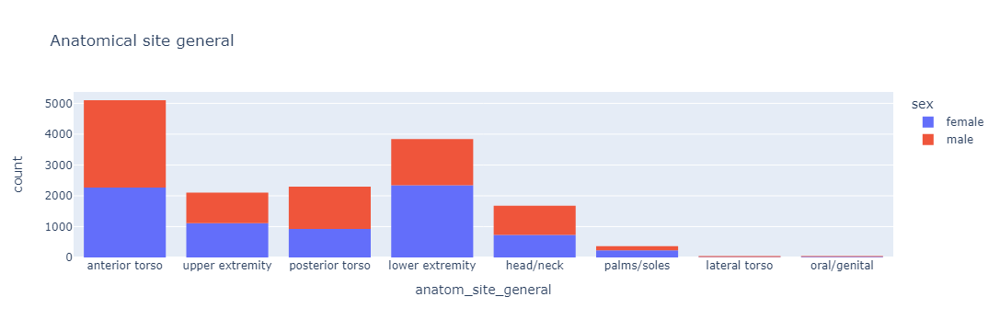

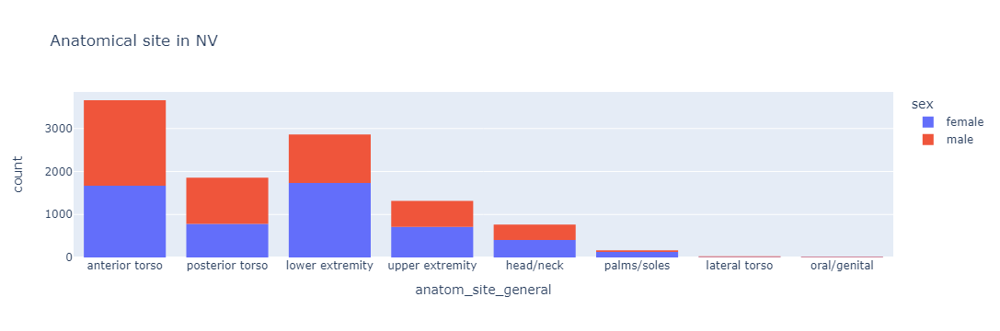

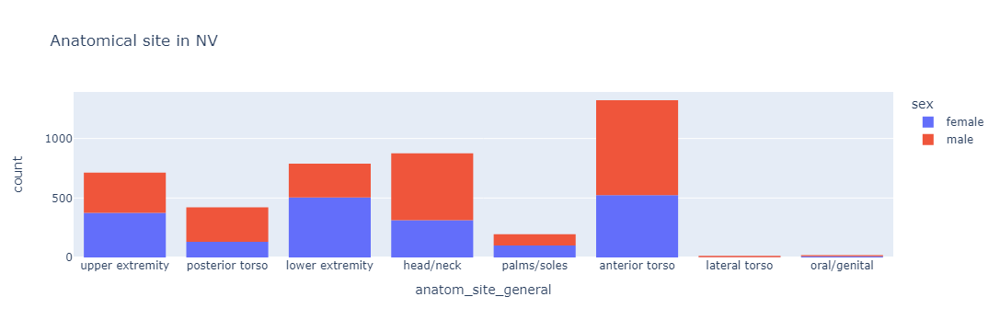

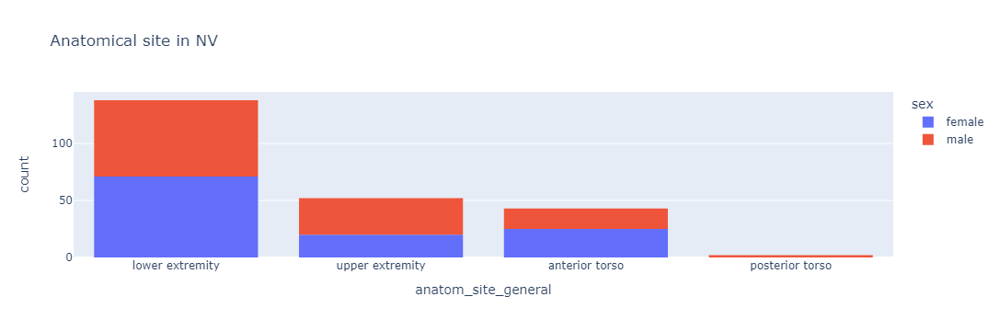

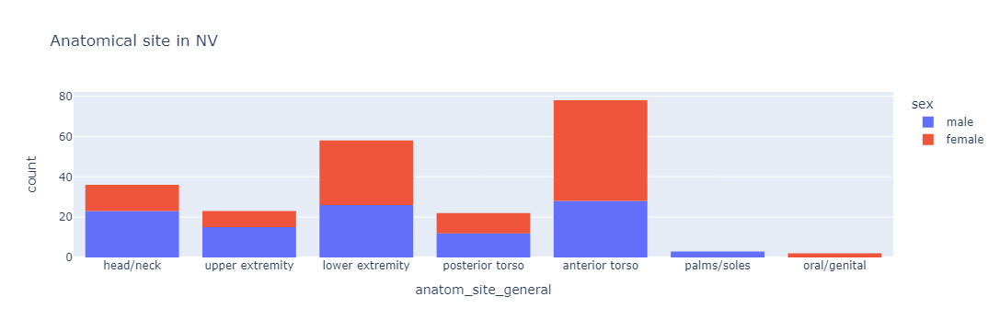

In [17]:
fig = px.histogram(df, x="anatom_site_general",color='sex',title='Anatomical site general')
fig.show()

fig = px.histogram(dfNV, x="anatom_site_general",color='sex',title='Anatomical site in NV')
fig.show()
                   
fig = px.histogram(dfBCC, x="anatom_site_general",color='sex',title='Anatomical site in NV')
fig.show()
                   
fig = px.histogram(dfDF, x="anatom_site_general",color='sex',title='Anatomical site in NV')
fig.show()
                   
fig = px.histogram(dfVASC, x="anatom_site_general",color='sex',title='Anatomical site in NV')
fig.show()

In [6]:
print('Total number of images: %s' % len(df.index))


print('\nTotal number of NV images: %s' % len(dfNV.index))
print('Total number of MEL images : %s' % len(dfMEL.index))
print('Total number of DF images: %s' % len(dfDF.index))
print('Total number of VASC images: %s' % len(dfVASC.index))
print('Total number of UNKNOWN images: %s' % len(df[df['UNK']==1.0].index))

Total number of images: 17889

Total number of NV images: 12875
Total number of MEL images : 4522
Total number of DF images: 239
Total number of VASC images: 253
Total number of UNKNOWN images: 0


In [15]:
def get_images(diagnosis):
    fig, ax = plt.subplots(1,5,figsize=(25, 25))
    for i in range(5):
        image_index = random.choice(df.loc[df[diagnosis]==1.0]['image'].reset_index(drop=True))
        image_path = f'{imagePath}{image_index}.jpg'
        img = cv2.imread(image_path)
        img = img[...,[2,1,0]]
        ax[i].set_title(f' {str(diagnosis)}')
        ax[i].imshow(img)
    plt.show()
    

True
True
True
True
True


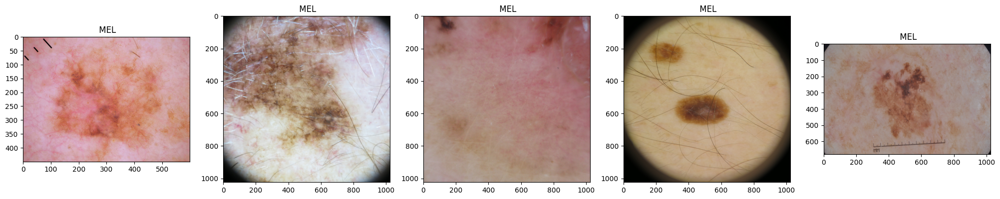

True
True
True
True
True


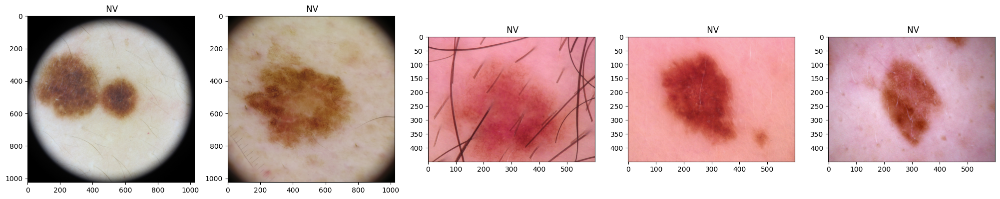

True
True
True
True
True


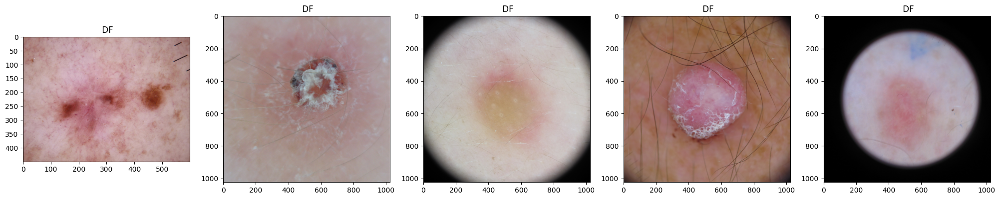

True
True
True
True
True


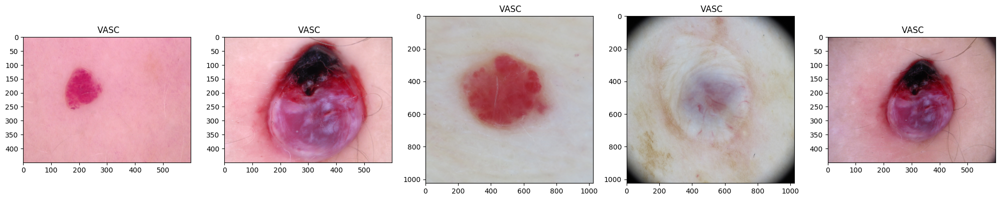

In [16]:

for name_diagnosis in df.columns[1:5]:
    get_images(name_diagnosis)


In [279]:
def findThresh(histogram):
    peaks = detect_peaks(histogram,mpd=100)
    valleys = detect_peaks(histogram,mpd=10,valley=True)
    
    
    maxPeak = max(peaks)
    maxValley=0
    for valley in valleys:
            if(valley>maxPeak): break
            maxValley = valley
    
    thresh= maxValley/255
    return thresh

In [257]:
def getImportantRegion(df):
    #choosing ten biggest regions
    df = df[df['perimeter']> 100]
    df = df.sort_values(by='area', ascending=False)
    biggestAreas = df['area'].nlargest(n=10).tolist()
    
    if(len(biggestAreas)==0):return pd.DataFrame()
    
    #deleting all much smaller
    x = math.floor(math.log(biggestAreas[0],10))
    
    temp = []
    for area in biggestAreas:
        if(x-math.floor(math.log(area,10)) < 2):
            temp.append(area)
    
    df= df[df['area'].isin(temp)]
    
    #choosing most round region
    return df[(df['eccentricity'] == df['eccentricity'].min())]
    

In [258]:
def addVariegation(df):
    image_name = df['image name'].item()
    image_path = f'{imagePath}{image_name}.jpg'
    image=cv2.imread(image_path) 
    
    lesion_r = image[:, :, 0]
    lesion_g = image[:, :, 1]
    lesion_b = image[:, :, 2]

    C_r = np.std(lesion_r) / np.max(lesion_r)
    C_g = np.std(lesion_g) / np.max(lesion_g)
    C_b = np.std(lesion_b) / np.max(lesion_b)
    
    df['Red variegation']= C_r
    df['Green variegation']= C_g
    df['Blue variegation']= C_b
    return df


In [259]:
def addAsymmetry(df):
    area_total = df['area'].item()   
    img_mask = im.fromarray(df['image'].item())

    horizontal_flip = np.fliplr(img_mask)
    diff_horizontal = img_mask * ~horizontal_flip

    vertical_flip = np.flipud(img_mask)
    diff_vertical = img_mask * ~vertical_flip

    diff_horizontal_area = np.count_nonzero(diff_horizontal)
    diff_vertical_area = np.count_nonzero(diff_vertical)
    asymm_idx = 0.5 * ((diff_horizontal_area / area_total) + (diff_vertical_area / area_total))
    
    df['Asymmetry']= asymm_idx
    return df

In [235]:
def addOther(df):
    
    df['ratio_length'] = (df['major_axis_length'] / 
                      df['minor_axis_length'])
    df['perimeter_ratio_major'] = (df['perimeter'] /  
                               df['major_axis_length'])
    df['perimeter_ratio_minor'] = (df['perimeter'] /
                               df['minor_axis_length'])
    df['area_ratio_convex'] = df['area'] / df['convex_area']
    df['area_ratio_bbox'] = df['area'] / df['bbox_area']
    df['peri_over_dia'] = df['perimeter'] / df['equivalent_diameter']

    return df

In [260]:
def getData(filename):
    image_path = f'{imagePath}{filename}.jpg'
    im1=cv2.imread(image_path)
    im1=im1[:,:,::-1]

    gray_lesion = rgb2gray(im1)

    histogram, bin_edges = np.histogram(gray_lesion, bins=256, range=(0, 1))
    thresh = findThresh(histogram[30:])
    binarized = cv2.inRange(gray_lesion,0.1,thresh)

    closed = area_closing(binarized)
    opened = area_opening(closed)


    label_im = skimage.measure.label(opened)
    regions = regionprops(label_im)

    properties = ['area','convex_area','bbox_area',
                  'major_axis_length', 'minor_axis_length', 
                  'perimeter', 'equivalent_diameter',
                  'mean_intensity', 'solidity', 'eccentricity','image']

    dfRP=pd.DataFrame(regionprops_table(label_im, gray_lesion, 
                                   properties=properties))
    
    
    
    
    region = getImportantRegion(dfRP)
    region['image name'] = filename
    #display(region)
    
    if(region.empty):
        return region
    
    region = addVariegation(region)
    region = addAsymmetry(region)
    region = addOther(region)
    
    region = region.drop(columns=['area','convex_area','bbox_area',
                  'major_axis_length', 'minor_axis_length','image', 'equivalent_diameter'])
    
    return region.values.tolist()

In [ ]:
import timeit
start = timeit.timeit()
print("hello")

properties = [ 'perimeter','mean_intensity', 'solidity', 'eccentricity','image_name','Red variegation','Green variegation','Blue variegation',
                 'asymmetry','ratio_length','perimeter_ratio_major','perimeter_ratio_minor','area_ratio_convex','area_ratio_bbox','peri_over_dia']

data= []
for image_name in df['image']:
    print(image_name)
    data.extend(getData(image_name))


dfData = pd.DataFrame(data,columns= properties)
final_df = df.merge(dfData,left_on='image',right_on='image_name')
display(final_df)

end = timeit.timeit()
print(end - start)


hello
ISIC_0000000
ISIC_0000001
ISIC_0000002
ISIC_0000003
ISIC_0000004
ISIC_0000006
ISIC_0000007
ISIC_0000008
ISIC_0000009
ISIC_0000010
ISIC_0000011
ISIC_0000012
ISIC_0000013
ISIC_0000014
ISIC_0000015
ISIC_0000016
ISIC_0000017_downsampled
ISIC_0000018_downsampled
ISIC_0000019_downsampled
ISIC_0000020_downsampled
ISIC_0000021_downsampled
ISIC_0000022_downsampled
ISIC_0000023_downsampled
ISIC_0000024_downsampled
ISIC_0000025_downsampled
ISIC_0000026_downsampled
ISIC_0000027_downsampled
ISIC_0000028_downsampled
ISIC_0000029_downsampled
ISIC_0000030_downsampled
ISIC_0000031_downsampled
ISIC_0000032_downsampled
ISIC_0000034_downsampled
ISIC_0000035_downsampled
ISIC_0000036_downsampled
ISIC_0000037_downsampled
ISIC_0000038_downsampled
ISIC_0000039_downsampled
ISIC_0000040_downsampled
ISIC_0000041_downsampled
ISIC_0000042_downsampled
ISIC_0000043_downsampled
ISIC_0000044_downsampled
ISIC_0000045_downsampled
ISIC_0000046_downsampled
ISIC_0000047_downsampled
ISIC_0000048_downsampled
ISIC_000004

In [272]:
X = final_df.drop(['Type','image','image_name','anatom_site_general','sex'], axis=1)
y = final_df['Type']

X=X.fillna(X.mean())

X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                         test_size=0.25, 
                                         stratify = y, 
                                         random_state=1337)

In [278]:
RF = RandomForestClassifier(max_depth=20, n_estimators=200)
RF.fit(X_train, y_train)
y_pred_RF= RF.predict(X_test)
df = pd.DataFrame()
cols = ['Machine Learning Classification Method',
        'Train Accuracy', 
        'Test Accuracy', 
        "Top 1 Feature Predictor",
        "Top 2 Feature Predictor",
        "Top 3 Feature Predictor",
        "Top 4 Feature Predictor",
        "Top 5 Feature Predictor",
       "Top 6 Feature Predictor",
        "Top 7 Feature Predictor",
        "Top 8 Feature Predictor",
        "Top 9 Feature Predictor",
        "Top 10 Feature Predictor"]
df.loc['Machine Learning Classification Method', 
       'Details'] = 'Random Forest Classifier'
df.loc['Train Accuracy', 'Details'] = RF.score(X_train, y_train) 
df.loc['Test Accuracy', 'Details'] = RF.score(X_test, y_test)
importances = (X.columns[np.argsort(RF.feature_importances_)][-10:])
df.loc['Top 1 Feature Predictor', 'Details'] = importances[9]
df.loc['Top 2 Feature Predictor', 'Details'] = importances[8]
df.loc['Top 3 Feature Predictor', 'Details'] = importances[7]
df.loc['Top 4 Feature Predictor', 'Details'] = importances[6]
df.loc['Top 5 Feature Predictor', 'Details'] = importances[5]
df.loc['Top 6 Feature Predictor', 'Details'] = importances[4]
df.loc['Top 7 Feature Predictor', 'Details'] = importances[3]
df.loc['Top 8 Feature Predictor', 'Details'] = importances[2]
df.loc['Top 9 Feature Predictor', 'Details'] = importances[1]
df.loc['Top 10 Feature Predictor', 'Details'] = importances[0]
display(df)






,Details
Machine Learning Classification Method,Random Forest Classifier
Train Accuracy,0.989302
Test Accuracy,0.804084
Top 1 Feature Predictor,age_approx
Top 2 Feature Predictor,Blue variegation
Top 3 Feature Predictor,Green variegation
Top 4 Feature Predictor,Red variegation
Top 5 Feature Predictor,perimeter
Top 6 Feature Predictor,mean_intensity
Top 7 Feature Predictor,eccentricity
